In [1]:
import warnings
warnings.filterwarnings("ignore") 

import pysm3 as pysm
import pysm3.units as u
import numpy as np
import healpy as hp 
import matplotlib.pyplot as plt
import scipy.stats as stat
import matplotlib as mpl
import astropy.io.fits as fits
import scipy.constants as con

mpl.rcParams['font.sans-serif'] = "Helvetica"
plt.style.use('default')

In [2]:
nside = 1024
nside_wmap = 512
npix = hp.nside2npix(nside)
lmax = 3 * nside - 1 
lmax_wmap = 3 * nside_wmap - 1
lmax_o = 512
hpx_datapath = '/Users/shamik/opt/Healpix_3.81/data'

Text(0.5, 1.0, 'LFI 30GHz average RIMO bandpass')

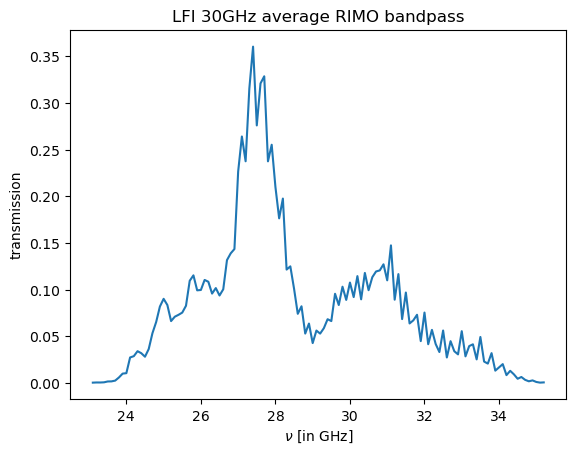

In [3]:
RIMO_file = '../resources/LFI_RIMO_R3.31.fits'
hdul = fits.open(RIMO_file)

band = '030'

nus_in_GHz = hdul['BANDPASS_'+band].data['WAVENUMBER']
transmission = hdul['BANDPASS_'+band].data['TRANSMISSION']

nus_in_GHz = nus_in_GHz[transmission>0.001*np.max(transmission)]
transmission = transmission[transmission>0.001*np.max(transmission)]

# transmission /= np.trapz(transmission, x=nus_in_GHz*con.giga)
nus_in_GHz = np.array(nus_in_GHz, dtype=np.float64)
transmission = np.array(transmission,dtype=np.float64)

plt.plot(nus_in_GHz, transmission)
plt.xlabel(r'$\nu$ [in GHz]')
plt.ylabel('transmission')
plt.title('LFI 30GHz average RIMO bandpass')

In [322]:
np.trapz(transmission, x=nus_in_GHz*con.giga)

999708305.4113675

In [4]:
UC = pysm.bandpass_unit_conversion(nus_in_GHz*u.GHz, weights=transmission, output_unit=u.uK_CMB, input_unit=u.uK_RJ, cut=1e-10)
print(UC)

1.0218009090326254 uK_CMB / uK_RJ


In [5]:
sync_4 = pysm.Sky(nside=nside, preset_strings=["s4"])
syncmap_4 = sync_4.get_emission(nus_in_GHz * u.GHz, transmission)

sync_5 = pysm.Sky(nside=nside, preset_strings=["s5"])
syncmap_5 = sync_5.get_emission(nus_in_GHz * u.GHz, transmission)

sync_7 = pysm.Sky(nside=nside, preset_strings=["s7"])
syncmap_7 = sync_7.get_emission(nus_in_GHz * u.GHz, transmission)

UC = pysm.bandpass_unit_conversion(nus_in_GHz*u.GHz, weights=transmission, output_unit=u.uK_CMB, input_unit=u.uK_RJ, cut=1e-10)

syncmap_4 = syncmap_4 * UC
syncmap_4 = hp.smoothing(syncmap_4, fwhm=np.deg2rad(33.1/60.), use_weights=True, datapath=hpx_datapath)
hp.write_map('../data/sync4_v3.4b6_LFI030-bpi_' + str(nside) + '.fits', syncmap_4, dtype=['float32','float32','float32'], overwrite=True)

syncmap_5 = syncmap_5 * UC
syncmap_5 = hp.smoothing(syncmap_5, fwhm=np.deg2rad(33.1/60.), use_weights=True, datapath=hpx_datapath)
hp.write_map('../data/sync5_v3.4b6_LFI030-bpi_' + str(nside) + '.fits', syncmap_5, dtype=['float32','float32','float32'], overwrite=True)

syncmap_7 = syncmap_7 * UC
syncmap_7 = hp.smoothing(syncmap_7, fwhm=np.deg2rad(33.1/60.), use_weights=True, datapath=hpx_datapath)
hp.write_map('../data/sync7_v3.4b6_LFI030-bpi_' + str(nside) + '.fits', syncmap_7, dtype=['float32','float32','float32'], overwrite=True)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


(201, 3) (201, 3) False


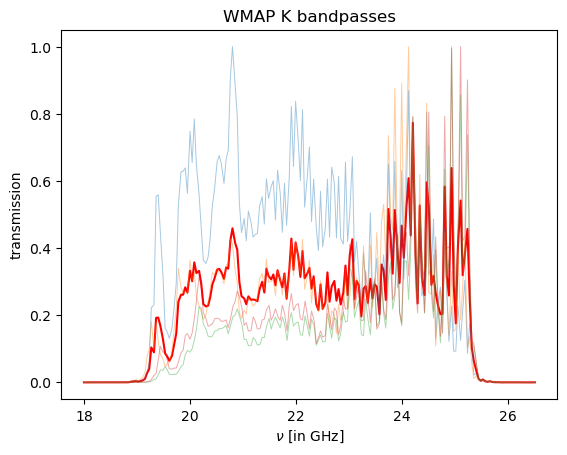

In [236]:
K11 = np.loadtxt('../resources/WMAP_9yr_K11_bandpass.dat')
K12 = np.loadtxt('../resources/WMAP_9yr_K12_bandpass.dat')

print(K11.shape, K12.shape, np.any((K11[:,0]-K12[:,0]) > 0.))

nus_in_GHz = K11[:,0]
bandpass_avg = ( K11[:,1] + K11[:,2] + K12[:,1] + K12[:,2] ) / 4.

plt.plot(nus_in_GHz, bandpass_avg, 'r-')
plt.plot(K11[:,0], K11[:,1], lw=0.7, alpha=0.4)
plt.plot(K11[:,0], K11[:,2], lw=0.7, alpha=0.4)
plt.plot(K12[:,0], K12[:,1], lw=0.7, alpha=0.4)
plt.plot(K12[:,0], K12[:,2], lw=0.7, alpha=0.4)
plt.xlabel(r'$\nu$ [in GHz]')
plt.ylabel('transmission')
plt.title('WMAP K bandpasses')
plt.savefig('../output/WMAP_K_bandpass_average.jpg')

In [9]:
sync_4 = pysm.Sky(nside=nside_wmap, preset_strings=["s4"])
syncmap_4 = sync_4.get_emission(nus_in_GHz * u.GHz, bandpass_avg)

sync_5 = pysm.Sky(nside=nside_wmap, preset_strings=["s5"])
syncmap_5 = sync_5.get_emission(nus_in_GHz * u.GHz, bandpass_avg)

sync_7 = pysm.Sky(nside=nside_wmap, preset_strings=["s7"])
syncmap_7 = sync_7.get_emission(nus_in_GHz * u.GHz, bandpass_avg)

UC = pysm.bandpass_unit_conversion(nus_in_GHz*u.GHz, weights=bandpass_avg, output_unit=u.uK_CMB, input_unit=u.uK_RJ, cut=1e-10)

syncmap_4 = syncmap_4 * UC
syncmap_4 = hp.smoothing(syncmap_4, fwhm=np.deg2rad(52.8/60.), use_weights=True, datapath=hpx_datapath)
hp.write_map('../data/sync4_v3.4b6_WMAPK-bpi_' + str(nside_wmap) + '.fits', syncmap_4, dtype=['float32','float32','float32'], overwrite=True)

syncmap_5 = syncmap_5 * UC
syncmap_5 = hp.smoothing(syncmap_5, fwhm=np.deg2rad(52.8/60.), use_weights=True, datapath=hpx_datapath)
hp.write_map('../data/sync5_v3.4b6_WMAPK-bpi_' + str(nside_wmap) + '.fits', syncmap_5, dtype=['float32','float32','float32'], overwrite=True)

syncmap_7 = syncmap_7 * UC
syncmap_7 = hp.smoothing(syncmap_7, fwhm=np.deg2rad(52.8/60.), use_weights=True, datapath=hpx_datapath)
hp.write_map('../data/sync7_v3.4b6_WMAPK-bpi_' + str(nside_wmap) + '.fits', syncmap_7, dtype=['float32','float32','float32'], overwrite=True)

#### LFI 30 GHz and WMAP K band

In [4]:
iqu_npipe30  = hp.read_map('../data/npipe6v20_030_map.fits',  field=None) * 1e6
iqu_npipe30A = hp.read_map('../data/npipe6v20A_030_map.fits', field=None) * 1e6
iqu_npipe30B = hp.read_map('../data/npipe6v20B_030_map.fits', field=None) * 1e6 

pol_npipe30 = np.sqrt(iqu_npipe30[1]**2. + iqu_npipe30[2]**2.)
pol_npipe30A = np.sqrt(iqu_npipe30A[1]**2. + iqu_npipe30A[2]**2.)
pol_npipe30B = np.sqrt(iqu_npipe30B[1]**2. + iqu_npipe30B[2]**2.)

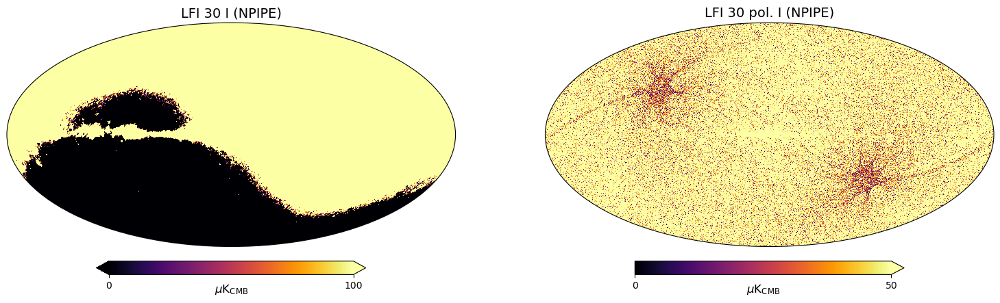

In [5]:
hp.projview(m=iqu_npipe30[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 I (NPIPE)', graticule_color=None)
hp.projview(m=pol_npipe30, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 pol. I (NPIPE)', graticule_color=None)

False


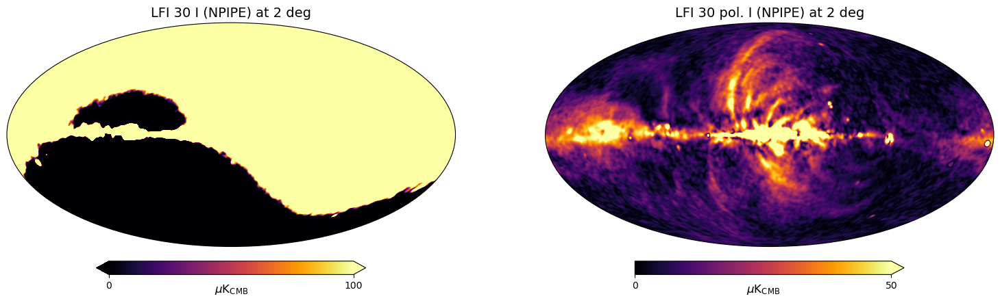

In [6]:
alms = hp.map2alm(iqu_npipe30, lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

print(np.any(np.isnan(Bl_com[:,1]/Bl_30[:,1])))

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_npipe30_smth = hp.alm2map(alms, nside)
pol_npipe30_smth = np.sqrt(iqu_npipe30_smth[1]**2. + iqu_npipe30_smth[2]**2.)

E_npipe30_smth = hp.alm2map(alms[1], nside)
B_npipe30_smth = hp.alm2map(alms[2], nside)

hp.projview(m=iqu_npipe30_smth[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 I (NPIPE) at 2 deg', graticule_color=None)
hp.projview(m=pol_npipe30_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 pol. I (NPIPE) at 2 deg', graticule_color=None)

In [7]:
smica_PR3 = hp.read_map('../data/COM_CMB_IQU-smica_2048_R3.00_full.fits', field=None) * 1e6

alms = hp.map2alm(smica_PR3[0:3], lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

print(np.any(np.isnan(Bl_com[:,1]/Bl_30[:,1])))

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_smica_smth = hp.alm2map(alms, nside)
pol_smica_smth = np.sqrt(iqu_smica_smth[1]**2. + iqu_smica_smth[2]**2.)

E_smica_smth = hp.alm2map(alms[1], nside)
B_smica_smth = hp.alm2map(alms[2], nside)

False


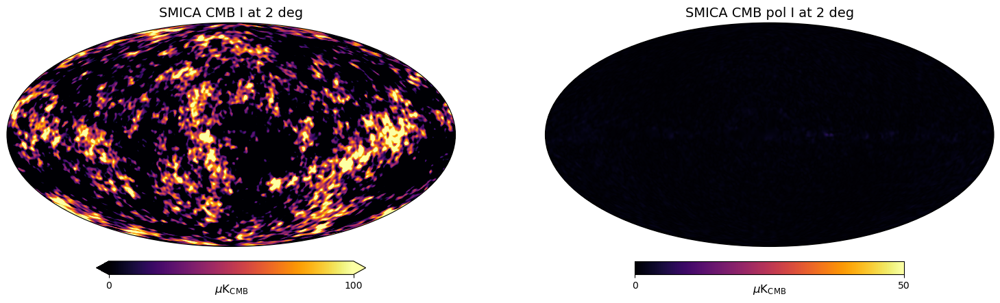

In [8]:
hp.projview(m=iqu_smica_smth[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='SMICA CMB I at 2 deg', graticule_color=None)
hp.projview(m=pol_smica_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='SMICA CMB pol I at 2 deg', graticule_color=None)

False


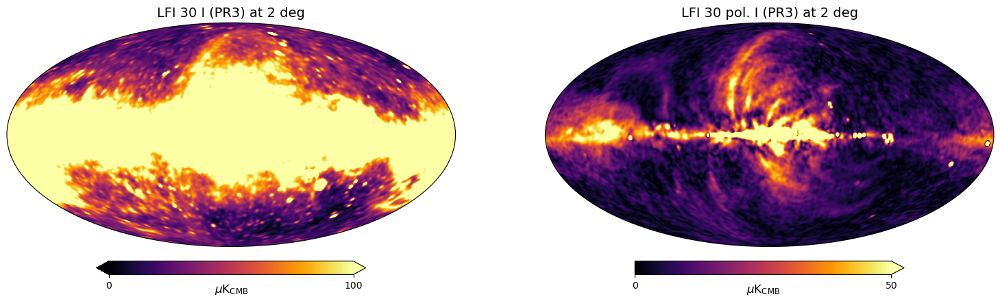

In [9]:
lfi30_PR3 = hp.read_map('../data/LFI_SkyMap_030-BPassCorrected-field-IQU_1024_R3.00_full.fits', field=None) * 1e6

alms = hp.map2alm(lfi30_PR3, lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

print(np.any(np.isnan(Bl_com[:,1]/Bl_30[:,1])))

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_pr330_smth = hp.alm2map(alms, nside)
pol_pr330_smth = np.sqrt(iqu_pr330_smth[1]**2. + iqu_pr330_smth[2]**2.)

E_pr330_smth = hp.alm2map(alms[1], nside)
B_pr330_smth = hp.alm2map(alms[2], nside)

hp.projview(m=iqu_pr330_smth[0] - iqu_smica_smth[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 I (PR3) at 2 deg', graticule_color=None)
hp.projview(m=pol_pr330_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 pol. I (PR3) at 2 deg', graticule_color=None)

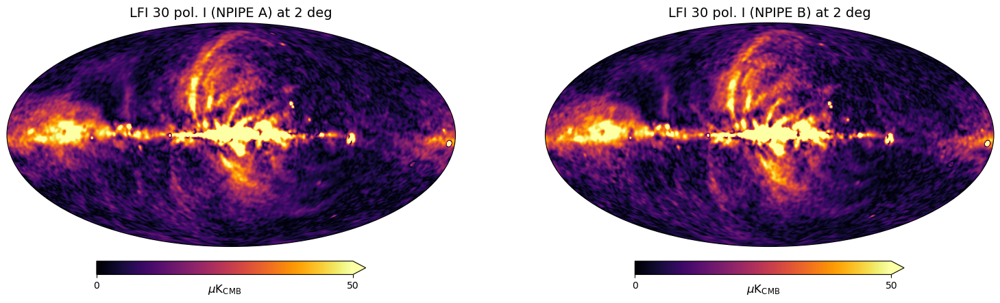

In [10]:
alms = hp.map2alm(iqu_npipe30A, lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_npipe30A_smth = hp.alm2map(alms, nside)
pol_npipe30A_smth = np.sqrt(iqu_npipe30A_smth[1]**2. + iqu_npipe30A_smth[2]**2.)

alms = hp.map2alm(iqu_npipe30B, lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_npipe30B_smth = hp.alm2map(alms, nside)
pol_npipe30B_smth = np.sqrt(iqu_npipe30B_smth[1]**2. + iqu_npipe30B_smth[2]**2.)

hp.projview(m=pol_npipe30A_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 pol. I (NPIPE A) at 2 deg', graticule_color=None)
hp.projview(m=pol_npipe30B_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 pol. I (NPIPE B) at 2 deg', graticule_color=None)

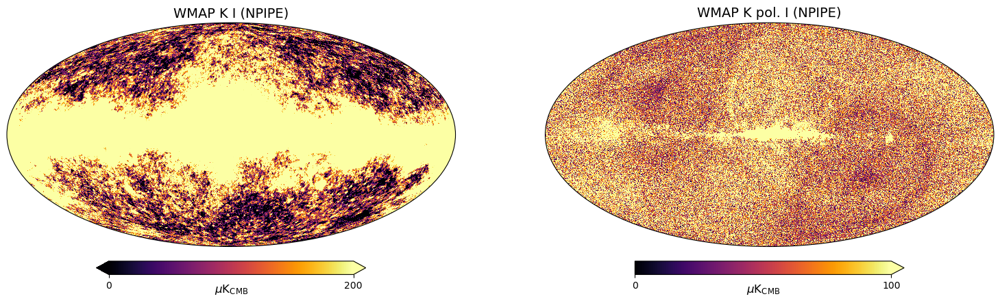

In [11]:
iqu_wmapk = hp.read_map('../data/wmap_band_iqumap_r9_9yr_K_v5.fits', field=None) * 1.e3
pol_wmapk = np.sqrt(iqu_wmapk[1]**2. + iqu_wmapk[2]**2.)

hp.projview(m=iqu_wmapk[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=200, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K I (NPIPE)', graticule_color=None)
hp.projview(m=pol_wmapk, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K pol. I (NPIPE)', graticule_color=None)

False


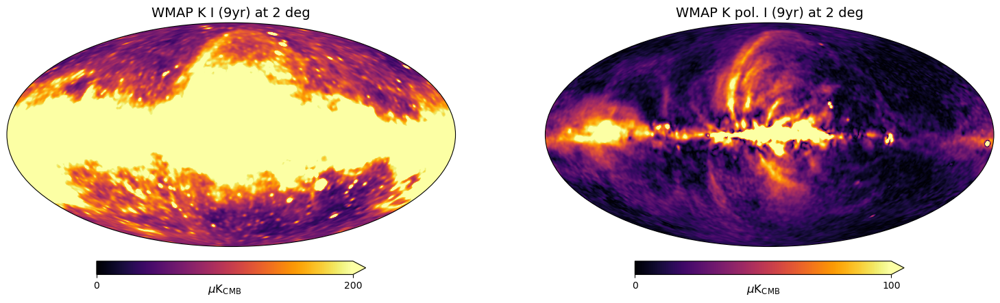

In [12]:
alms = hp.map2alm(iqu_wmapk[:3], lmax=lmax_wmap, use_weights=True, datapath=hpx_datapath)
Bl_k = hp.gauss_beam(np.deg2rad(52.8/60.), lmax=lmax_wmap, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax_wmap, pol=True)

print(np.any(np.isnan(Bl_com[:,1]/Bl_k[:,1])))

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_k[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_k[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_k[:,2])

iqu_wmapk_smth = hp.alm2map(alms, nside_wmap)
pol_wmapk_smth = np.sqrt(iqu_wmapk_smth[1]**2. + iqu_wmapk_smth[2]**2.)

hp.projview(m=iqu_wmapk_smth[0] - hp.ud_grade(iqu_smica_smth[0], nside_wmap), unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=200, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K I (9yr) at 2 deg', graticule_color=None)
hp.projview(m=pol_wmapk_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K pol. I (9yr) at 2 deg', graticule_color=None)

#### Mask choices

0.7047566572825114


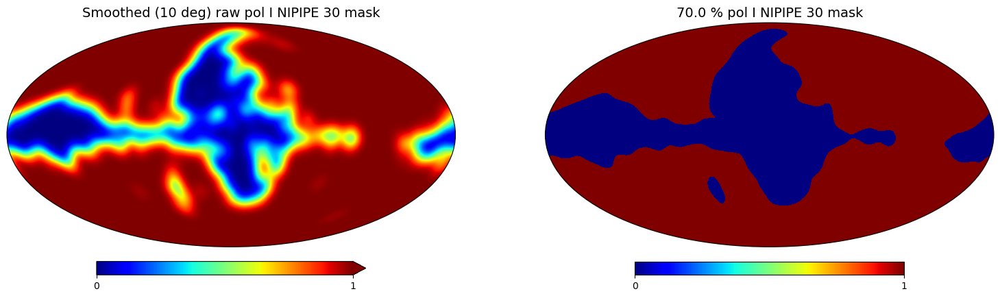

In [13]:
mask70 = np.zeros_like(pol_npipe30)
mask70[pol_npipe30_smth<=17] = 1.
mask_smth = hp.smoothing(mask70, fwhm=np.deg2rad(10.), use_weights=True, datapath=hpx_datapath)
mask70[mask_smth >= 0.73] = 1.
mask70[mask_smth < 0.73] = 0.
fsky = np.sum(mask70**2.) / hp.nside2npix(nside) 
print(fsky)
hp.projview(m=mask_smth, xsize=2000, width=15., sub=121, min=0., max=1, cmap='jet', graticule=False, projection_type='mollweide', 
title='Smoothed (10 deg) raw pol I NIPIPE 30 mask', graticule_color=None)
hp.projview(m=mask70,  xsize=2000, width=15., sub=122, min=0., max=1, cmap='jet', graticule=False, projection_type='mollweide', 
title=str(np.round(fsky*100))+' % pol I NIPIPE 30 mask', graticule_color=None)

0.6050514380137125


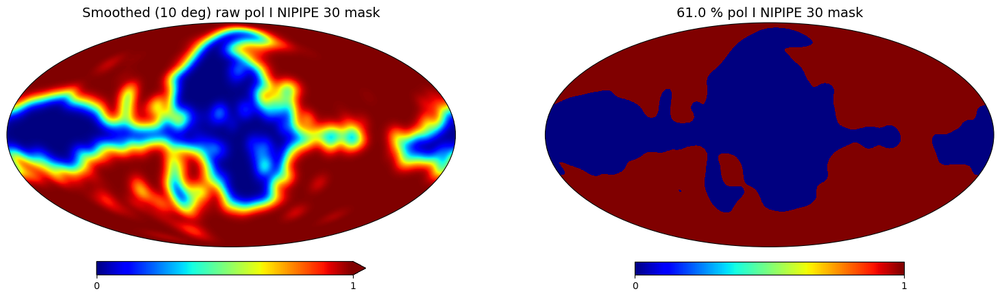

In [14]:
mask60 = np.zeros_like(pol_npipe30)
mask60[pol_npipe30_smth<=12.5] = 1.
mask_smth = hp.smoothing(mask60, fwhm=np.deg2rad(10.), use_weights=True, datapath=hpx_datapath)
mask60[mask_smth >= 0.73] = 1.
mask60[mask_smth < 0.73] = 0.
fsky = np.sum(mask60**2.) / hp.nside2npix(nside) 
print(fsky)
hp.projview(m=mask_smth, xsize=2000, width=15., sub=121, min=0., max=1, cmap='jet', graticule=False, projection_type='mollweide', 
title='Smoothed (10 deg) raw pol I NIPIPE 30 mask', graticule_color=None)
hp.projview(m=mask60,  xsize=2000, width=15., sub=122, min=0., max=1, cmap='jet', graticule=False, projection_type='mollweide', 
title=str(np.round(fsky*100))+' % pol I NIPIPE 30 mask', graticule_color=None)

0.5035118261973063


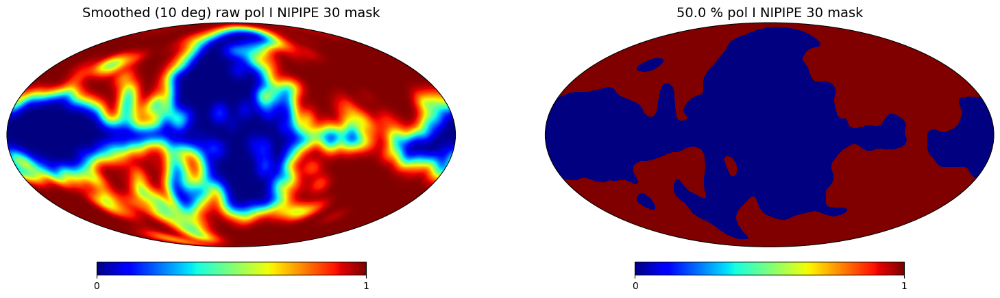

In [15]:
mask50 = np.zeros_like(pol_npipe30)
mask50[pol_npipe30_smth<=10] = 1.
mask_smth = hp.smoothing(mask50, fwhm=np.deg2rad(10.), use_weights=True, datapath=hpx_datapath)
mask50[mask_smth >= 0.71] = 1.
mask50[mask_smth < 0.71] = 0.
fsky = np.sum(mask50**2.) / hp.nside2npix(nside) 
print(fsky)
hp.projview(m=mask_smth, xsize=2000, width=15., sub=121, min=0., max=1, cmap='jet', graticule=False, projection_type='mollweide', 
title='Smoothed (10 deg) raw pol I NIPIPE 30 mask', graticule_color=None)
hp.projview(m=mask50,  xsize=2000, width=15., sub=122, min=0., max=1, cmap='jet', graticule=False, projection_type='mollweide', 
title=str(np.round(fsky*100))+' % pol I NIPIPE 30 mask', graticule_color=None)

In [82]:
hp.write_map('../data/sync70_mask_1024.fits', mask70)
hp.write_map('../data/sync60_mask_1024.fits', mask60)
hp.write_map('../data/sync50_mask_1024.fits', mask50)

setting the output map dtype to [dtype('float32')]
setting the output map dtype to [dtype('float32')]
setting the output map dtype to [dtype('float32')]


In [83]:
mask_70_512 = hp.ud_grade(mask70, nside_wmap)
mask_60_512 = hp.ud_grade(mask60, nside_wmap)
mask_50_512 = hp.ud_grade(mask50, nside_wmap)

mask_70_512[mask_70_512 >= 0.9] = 1. 
mask_70_512[mask_70_512 < 0.9] = 0. 

mask_60_512[mask_60_512 >= 0.9] = 1. 
mask_60_512[mask_60_512 < 0.9] = 0. 

mask_50_512[mask_50_512 >= 0.9] = 1. 
mask_50_512[mask_50_512 < 0.9] = 0. 

hp.write_map('../data/sync70_mask_512.fits', mask_70_512)
hp.write_map('../data/sync60_mask_512.fits', mask_60_512)
hp.write_map('../data/sync50_mask_512.fits', mask_50_512)

setting the output map dtype to [dtype('float32')]
setting the output map dtype to [dtype('float32')]
setting the output map dtype to [dtype('float32')]


Read apodized masks produced with NaMaster with 2 deg and 3 deg C2 apodization for 1024 and 512 masks respectively

In [16]:
mask70 = hp.read_map('../data/sync70_mask_apo1024.fits')
mask60 = hp.read_map('../data/sync60_mask_apo1024.fits')
mask50 = hp.read_map('../data/sync50_mask_apo1024.fits')

mask70_512 = hp.read_map('../data/sync70_mask_apo512.fits')
mask60_512 = hp.read_map('../data/sync60_mask_apo512.fits')
mask50_512 = hp.read_map('../data/sync50_mask_apo512.fits')

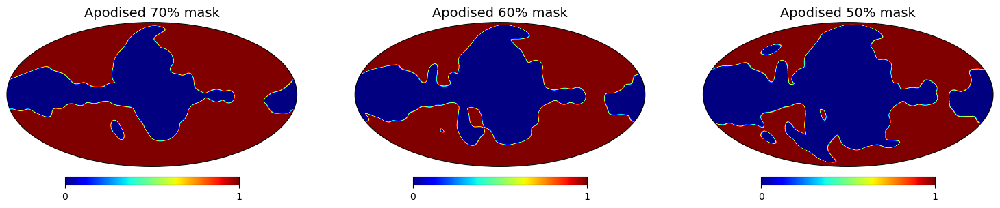

In [17]:
hp.projview(m=mask70, xsize=2000, width=15., sub=131, min=0., max=1, cmap='jet', graticule=False, projection_type='mollweide', 
title='Apodised 70% mask', graticule_color=None)
hp.projview(m=mask60,  xsize=2000, width=15., sub=132, min=0., max=1, cmap='jet', graticule=False, projection_type='mollweide', 
title='Apodised 60% mask', graticule_color=None)
hp.projview(m=mask50,  xsize=2000, width=15., sub=133, min=0., max=1, cmap='jet', graticule=False, projection_type='mollweide', 
title='Apodised 50% mask', graticule_color=None)

Read apodized masks produced with NaMaster with 2 deg and 3 deg C2 apodization for 1024 and 512 respectively

In [18]:
ps_mask_1024 = hp.read_map('../resources/lfi30_pol-ps_mask_1024.fits')
ps_mask_512 = hp.read_map('../resources/lfi30_pol-ps_mask_512.fits')

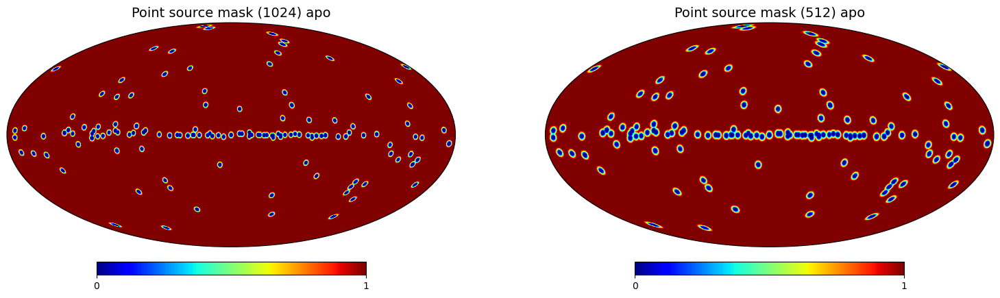

In [19]:
hp.projview(m=ps_mask_1024, xsize=2000, width=15., sub=121, min=0., max=1, cmap='jet', graticule=False, projection_type='mollweide', 
title='Point source mask (1024) apo', graticule_color=None)
hp.projview(m=ps_mask_512, xsize=2000, width=15., sub=122, min=0., max=1, cmap='jet', graticule=False, projection_type='mollweide', 
title='Point source mask (512) apo', graticule_color=None)

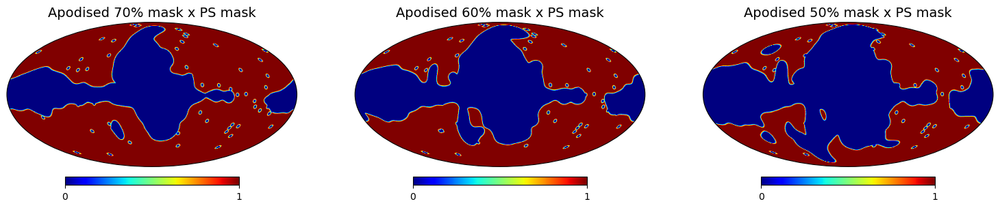

In [20]:
hp.projview(m=mask70 * ps_mask_1024, xsize=2000, width=15., sub=131, min=0., max=1, cmap='jet', graticule=False, projection_type='mollweide', 
title='Apodised 70% mask x PS mask', graticule_color=None)
hp.projview(m=mask60 * ps_mask_1024,  xsize=2000, width=15., sub=132, min=0., max=1, cmap='jet', graticule=False, projection_type='mollweide', 
title='Apodised 60% mask x PS mask', graticule_color=None)
hp.projview(m=mask50 * ps_mask_1024,  xsize=2000, width=15., sub=133, min=0., max=1, cmap='jet', graticule=False, projection_type='mollweide', 
title='Apodised 50% mask x PS mask', graticule_color=None)

#### Power spectra of observed maps

In [21]:
# Read theory Cls computed with CLASS for debiasing 
Dl_lensed = np.loadtxt('../resources/class_cl_lensed.dat')
factor = Dl_lensed[:,0] * (Dl_lensed[:,0] + 1) / 2. / np.pi
ellmax = 1024

T_CMB = 2.7255 * 1.e6 # uK

Bl = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=ellmax, pol=True)

TT = np.array(Dl_lensed[:ellmax-1,1] * T_CMB**2. / factor[:ellmax-1]) 
EE = np.array(Dl_lensed[:ellmax-1,2] * T_CMB**2. / factor[:ellmax-1])
TE = np.array(Dl_lensed[:ellmax-1,3] * T_CMB**2. / factor[:ellmax-1])
BB = np.array(Dl_lensed[:ellmax-1,4] * T_CMB**2. / factor[:ellmax-1])

TT = np.insert(TT, [0,1], [0.,0.])
EE = np.insert(EE, [0,1], [0.,0.])
TE = np.insert(TE, [0,1], [0.,0.])
BB = np.insert(BB, [0,1], [0.,0.])

EE = EE[:ellmax+1] * Bl[:ellmax+1,1]**2.
BB = BB[:ellmax+1] * Bl[:ellmax+1,2]**2.

In [22]:
# Read Planck EE power spectrum for debiasing EE observed power
ls, plkEE, perrplkEE, merrplkEE  = np.loadtxt('../resources/COM_PowerSpect_CMB-EE-full_R3.01.txt', unpack=True)
calPLK = 0.1000442E+01

plkEE = np.concatenate([np.array([0., 0.]), plkEE])

In [23]:
def setup_bins(lmax_o, bsz_0=10, loglims=[[1.2]]):
# 
# Set scaling as [scaling, lmax_scale] for each choice. 
# If same scaling wanted for entire ell range set only scaling.
# Thus loglims is a tuple if signgle or double element lists: 
# [[sca_1, lmax_sca1],[sca_2, lmax_sca2],...] 
#
    i = 0
    bin_sz = []
    # ell_min = [] 
    leff = []
    while True:
        # print(i)
        if i == 0:
            ell_min_d = 2
            ell_max_d = bsz_0
        else :
            ell_min_d = ell_max_d + 1
            
            for i in range(len(loglims)):

                if len(loglims[i]) == 1:
                    ell_max_d = np.int(np.maximum(ell_min_d + bsz_0, np.ceil(loglims[i][0] * ell_min_d)))
                    break
                elif len(loglims[i]) == 2:
                    if ell_min_d < loglims[i][1]:
                        ell_max_d = np.int(np.maximum(ell_min_d + bsz_0, np.ceil(loglims[i][0] * ell_min_d)))
                        break

        if ell_max_d > lmax_o:
            # print(ell_max_d)
            break
        else:
            # ell_min.append(ell_min_d)
            bin_sz.append(np.int(ell_max_d - ell_min_d + 1))
            leff.append((ell_min_d + ell_max_d) / 2.)
            # print(ell_min[i], ell_max_d, LL[i])
            i = i + 1

    bin_sz = np.array(bin_sz)
    # ell_min = np.array(ell_min)
    leff = np.array(leff) 

    return leff, bin_sz#, ell_min

leff, bin_sz = setup_bins(lmax_o)

def binner(Dell_in, is_Cell = False, fixed_bins=False):
    ell = np.arange(lmax_o+1)
    Dell_factor = ell * (ell + 1.) / 2. / np.pi

    Dell = np.copy(Dell_in[0:lmax_o+1])

    if is_Cell :
        Dell = Dell_factor[0:lmax_o+1] * Dell    

    Dell_binned = []

    if fixed_bins :
        bsz= bin_sz * np.ones(len(leff), dtype=np.int32)
    else :
        bsz = bin_sz

    # print(bsz)
    lmin_i = 2
    lmax_i = lmin_i + bsz[0]

    for i in range(0,len(leff)):
        # print(lmin_i, lmax_i)                                               
        dummy = np.sum(Dell[lmin_i:lmax_i])  / (lmax_i - lmin_i)
        
        Dell_binned.append(dummy)  

        if i < len(leff)-1:
            lmin_i = lmax_i
            lmax_i = lmin_i + bsz[i+1]    
        
    del dummy, Dell
    return np.array(Dell_binned)

In [88]:
def compute_Dl70(iqu_1, iqu_2=None, debias=False):
    nside1 = hp.npix2nside(len(iqu_1[0]))
    if nside1 == 1024:
        mask1 = mask70
        ps_mask1 = ps_mask_1024
    elif nside1 == 512:
        mask1 = mask70_512
        ps_mask1 = ps_mask_512
    
    lmax1 = 3*nside1 - 1

    alms_1 = hp.map2alm(iqu_1 * ps_mask1, lmax=lmax1, use_weights=True, datapath=hpx_datapath)
    E_1 = hp.alm2map(alms_1[1],nside1) * np.round(ps_mask1)
    B_1 = hp.alm2map(alms_1[2],nside1) * np.round(ps_mask1)
    fsky1 = np.sum((mask1 * ps_mask1)**2.)**2. / np.sum((mask1 * ps_mask1)**4.) * hp.nside2pixarea(nside1) / 4. / np.pi
    # fsky1 = np.sum((mask1 * ps_mask1)**2.) / len(iqu_1[0])

    if isinstance(iqu_2, (np.ndarray, list, tuple)):
        nside2 = hp.npix2nside(len(iqu_2[0]))
        if nside2 == 1024:
            mask2 = mask70
            ps_mask2 = ps_mask_1024
        elif nside2 == 512:
            mask2 = mask70_512
            ps_mask2 = ps_mask_512
            
        lmax2 = 3*nside2 - 1

        alms_2 = hp.map2alm(iqu_2 * ps_mask2, lmax=lmax2, use_weights=True, datapath=hpx_datapath)
        E_2 = hp.alm2map(alms_2[1],nside2) * np.round(ps_mask2)
        B_2 = hp.alm2map(alms_2[2],nside2) * np.round(ps_mask2)
        fsky2 = np.sum((mask2 * ps_mask2)**2.)**2. / np.sum((mask2 * ps_mask2)**4.) * hp.nside2pixarea(nside2) / 4. / np.pi
        # fsky2 = np.sum((mask2 * ps_mask2)**2.) / len(iqu_2[0])
    else:
        mask2 = mask1
        E_2 = E_1 
        B_2 = B_1
        fsky2 = fsky1

    # print(nside1, lmax1, fsky1, fsky2)
    
    ellmax = 1024
    ells = np.arange(0, ellmax+1)
    Dell_factor = ells * (ells + 1.) / 2. / np.pi

    if debias:
        DlEE_1x2 = Dell_factor * ((hp.anafast(E_1 * mask1, map2=E_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) - EE) 
        DlBB_1x2 = Dell_factor * ((hp.anafast(B_1 * mask1, map2=B_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) - BB) 
    else:
        DlEE_1x2 = Dell_factor * (hp.anafast(E_1 * mask1, map2=E_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) 
        DlBB_1x2 = Dell_factor * (hp.anafast(B_1 * mask1, map2=B_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) 

        
    return DlEE_1x2, DlBB_1x2

In [86]:
def compute_Dl60(iqu_1, iqu_2=None, debias=False):
    nside1 = hp.npix2nside(len(iqu_1[0]))
    if nside1 == 1024:
        mask1 = mask60
        ps_mask1 = ps_mask_1024
    elif nside1 == 512:
        mask1 = mask60_512
        ps_mask1 = ps_mask_512
    
    lmax1 = 3*nside1 - 1

    alms_1 = hp.map2alm(iqu_1 * ps_mask1, lmax=lmax1, use_weights=True, datapath=hpx_datapath)
    E_1 = hp.alm2map(alms_1[1],nside1) * np.round(ps_mask1)
    B_1 = hp.alm2map(alms_1[2],nside1) * np.round(ps_mask1)
    fsky1 = np.sum((mask1 * ps_mask1)**2.)**2. / np.sum((mask1 * ps_mask1)**4.) * hp.nside2pixarea(nside1) / 4. / np.pi
    # fsky1 = np.sum((mask1 * ps_mask1)**2.) / len(iqu_1[0])

    if isinstance(iqu_2, (np.ndarray, list, tuple)):
        nside2 = hp.npix2nside(len(iqu_2[0]))
        if nside2 == 1024:
            mask2 = mask60
            ps_mask2 = ps_mask_1024
        elif nside2 == 512:
            mask2 = mask60_512
            ps_mask2 = ps_mask_512
            
        lmax2 = 3*nside2 - 1

        alms_2 = hp.map2alm(iqu_2 * ps_mask2, lmax=lmax2, use_weights=True, datapath=hpx_datapath)
        E_2 = hp.alm2map(alms_2[1],nside2) * np.round(ps_mask2)
        B_2 = hp.alm2map(alms_2[2],nside2) * np.round(ps_mask2)
        fsky2 = np.sum((mask2 * ps_mask2)**2.)**2. / np.sum((mask2 * ps_mask2)**4.) * hp.nside2pixarea(nside2) / 4. / np.pi
        # fsky2 = np.sum((mask2 * ps_mask2)**2.) / len(iqu_2[0])
    else:
        mask2 = mask1
        E_2 = E_1 
        B_2 = B_1
        fsky2 = fsky1

    ellmax = 1024
    ells = np.arange(0, ellmax+1)
    Dell_factor = ells * (ells + 1.) / 2. / np.pi

    if debias:
        DlEE_1x2 = Dell_factor * ((hp.anafast(E_1 * mask1, map2=E_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) - EE) 
        DlBB_1x2 = Dell_factor * ((hp.anafast(B_1 * mask1, map2=B_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) - BB) 
    else:
        DlEE_1x2 = Dell_factor * (hp.anafast(E_1 * mask1, map2=E_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) 
        DlBB_1x2 = Dell_factor * (hp.anafast(B_1 * mask1, map2=B_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) 

        
    return DlEE_1x2, DlBB_1x2

In [87]:
def compute_Dl50(iqu_1, iqu_2=None, debias=False):
    nside1 = hp.npix2nside(len(iqu_1[0]))
    if nside1 == 1024:
        mask1 = mask50
        ps_mask1 = ps_mask_1024
    elif nside1 == 512:
        mask1 = mask50_512
        ps_mask1 = ps_mask_512
    
    lmax1 = 3*nside1 - 1

    alms_1 = hp.map2alm(iqu_1 * ps_mask1, lmax=lmax1, use_weights=True, datapath=hpx_datapath)
    E_1 = hp.alm2map(alms_1[1],nside1) * np.round(ps_mask1)
    B_1 = hp.alm2map(alms_1[2],nside1) * np.round(ps_mask1)
    fsky1 = np.sum((mask1 * ps_mask1)**2.)**2. / np.sum((mask1 * ps_mask1)**4.) * hp.nside2pixarea(nside1) / 4. / np.pi
    # fsky1 = np.sum((mask1 * ps_mask1)**2.) / len(iqu_1[0])

    if isinstance(iqu_2, (np.ndarray, list, tuple)):
        nside2 = hp.npix2nside(len(iqu_2[0]))
        if nside2 == 1024:
            mask2 = mask50
            ps_mask2 = ps_mask_1024
        elif nside2 == 512:
            mask2 = mask50_512
            ps_mask2 = ps_mask_512
            
        lmax2 = 3*nside2 - 1

        alms_2 = hp.map2alm(iqu_2 * ps_mask2, lmax=lmax2, use_weights=True, datapath=hpx_datapath)
        E_2 = hp.alm2map(alms_2[1],nside2) * np.round(ps_mask2)
        B_2 = hp.alm2map(alms_2[2],nside2) * np.round(ps_mask2)
        fsky2 = np.sum((mask2 * ps_mask2)**2.)**2. / np.sum((mask2 * ps_mask2)**4.) * hp.nside2pixarea(nside2) / 4. / np.pi
        # fsky2 = np.sum((mask2 * ps_mask2)**2.) / len(iqu_2[0])
    else:
        mask2 = mask1
        E_2 = E_1 
        B_2 = B_1
        fsky2 = fsky1

    ellmax = 1024
    ells = np.arange(0, ellmax+1)
    Dell_factor = ells * (ells + 1.) / 2. / np.pi

    if debias:
        DlEE_1x2 = Dell_factor * ((hp.anafast(E_1 * mask1, map2=E_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) - EE) 
        DlBB_1x2 = Dell_factor * ((hp.anafast(B_1 * mask1, map2=B_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) - BB) 
    else:
        DlEE_1x2 = Dell_factor * (hp.anafast(E_1 * mask1, map2=E_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) 
        DlBB_1x2 = Dell_factor * (hp.anafast(B_1 * mask1, map2=B_2 * mask2, lmax=ellmax, use_weights=True, datapath=hpx_datapath) / np.sqrt(fsky1 * fsky2)) 

        
    return DlEE_1x2, DlBB_1x2

In [89]:
DlEE_npipe_70, DlBB_npipe_70 = compute_Dl70(iqu_npipe30, debias=True) 
DlEE_npxk_70,   DlBB_npxk_70 = compute_Dl70(iqu_npipe30, iqu_2=iqu_wmapk[:3], debias=True)
DlEE_AxB_70,     DlBB_AxB_70 = compute_Dl70(iqu_npipe30A, iqu_2=iqu_npipe30B, debias=True)
DlEE_hd_70,       DlBB_hd_70 = compute_Dl70(0.5*(iqu_npipe30A - iqu_npipe30B))

In [92]:
DlEE_npipe_60, DlBB_npipe_60 = compute_Dl60(iqu_npipe30, debias=True) 
DlEE_npxk_60,   DlBB_npxk_60 = compute_Dl60(iqu_npipe30, iqu_2=iqu_wmapk[:3], debias=True)
DlEE_AxB_60,     DlBB_AxB_60 = compute_Dl60(iqu_npipe30A, iqu_2=iqu_npipe30B, debias=True)
DlEE_hd_60,       DlBB_hd_60 = compute_Dl60(0.5*(iqu_npipe30A - iqu_npipe30B))

In [93]:
DlEE_npipe_50, DlBB_npipe_50 = compute_Dl50(iqu_npipe30, debias=True) 
DlEE_npxk_50,   DlBB_npxk_50 = compute_Dl50(iqu_npipe30, iqu_2=iqu_wmapk[:3], debias=True)
DlEE_AxB_50,     DlBB_AxB_50 = compute_Dl50(iqu_npipe30A, iqu_2=iqu_npipe30B, debias=True)
DlEE_hd_50,       DlBB_hd_50 = compute_Dl50(0.5*(iqu_npipe30A - iqu_npipe30B))

#### PySM 3.4 beta 6 Synchrotron template

In [41]:
synch_template, header = hp.read_map('../data/synch_template_nside2048.fits', field=None, h=True)
print(header)

[('XTENSION', 'BINTABLE'), ('BITPIX', 8), ('NAXIS', 2), ('NAXIS1', 12288), ('NAXIS2', 49152), ('PCOUNT', 0), ('GCOUNT', 1), ('TFIELDS', 3), ('TTYPE1', 'TEMPERATURE'), ('TFORM1', '1024E'), ('TTYPE2', 'Q_POLARISATION'), ('TFORM2', '1024E'), ('TTYPE3', 'U_POLARISATION'), ('TFORM3', '1024E'), ('PIXTYPE', 'HEALPIX'), ('ORDERING', 'RING'), ('EXTNAME', 'xtension'), ('NSIDE', 2048), ('FIRSTPIX', 0), ('LASTPIX', 50331647), ('INDXSCHM', 'IMPLICIT'), ('OBJECT', 'FULLSKY'), ('COORDSYS', 'G'), ('TUNIT1', 'uK_RJ'), ('TUNIT2', 'uK_RJ'), ('TUNIT3', 'uK_RJ'), ('REF_FREQ', '23 GHz')]


In [219]:
polI_template = np.sqrt(synch_template[1]**2.+synch_template[2]**2.)

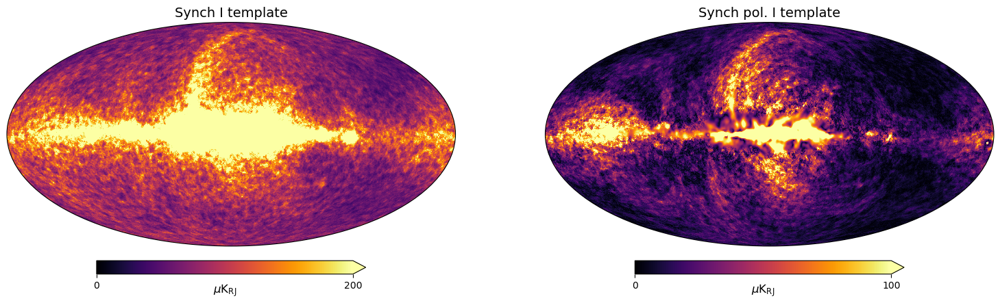

In [221]:
hp.projview(m=synch_template[0], unit=r'$\mu$K${}_{\rm RJ}$', xsize=2000, width=15., sub=121, min=0., max=200., cmap='inferno', graticule=False, projection_type='mollweide', 
title='Synch I template', graticule_color=None)
hp.projview(m=polI_template, unit=r'$\mu$K${}_{\rm RJ}$', xsize=2000, width=15., sub=122, min=0., max=100., cmap='inferno', graticule=False, projection_type='mollweide', 
title='Synch pol. I template', graticule_color=None)

#### Synchrotron model 4

In [48]:
iqu_s4_30 = hp.read_map('../data/sync4_v3.4b6_LFI030-bpi_' + str(nside) + '.fits', field=None, dtype=np.float64)
iqu_s4_k = hp.read_map('../data/sync4_v3.4b6_WMAPK-bpi_' + str(nside_wmap) + '.fits', field=None, dtype=np.float64)

pol_s4_30 = np.sqrt(iqu_s4_30[1]**2. + iqu_s4_30[2]**2.)
pol_s4_k  = np.sqrt(iqu_s4_k[1]**2.  + iqu_s4_k[2]**2.)

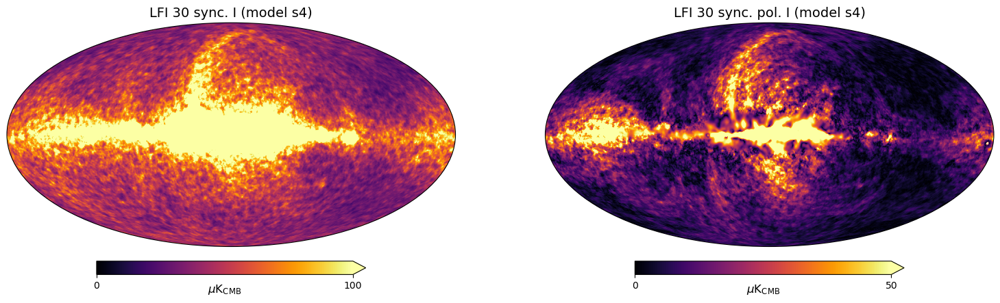

In [49]:
hp.projview(m=iqu_s4_30[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 sync. I (model s4)', graticule_color=None)
hp.projview(m=pol_s4_30, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 sync. pol. I (model s4)', graticule_color=None)

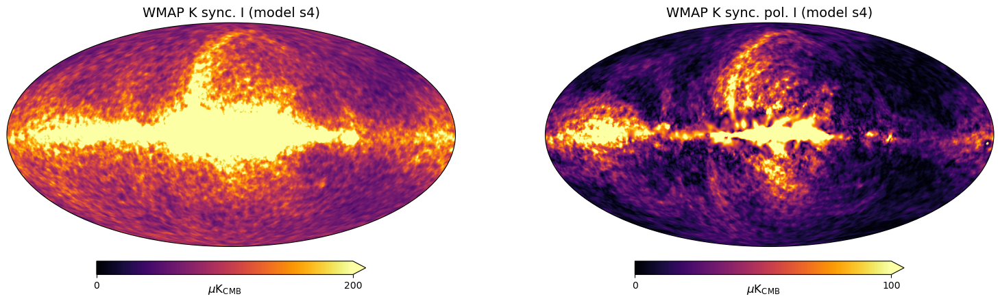

In [50]:
hp.projview(m=iqu_s4_k[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=200, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K sync. I (model s4)', graticule_color=None)
hp.projview(m=pol_s4_k, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K sync. pol. I (model s4)', graticule_color=None)

In [94]:
DlEE_s4_7030, DlBB_s4_7030 = compute_Dl70(iqu_s4_30)
DlEE_s4_70x,  DlBB_s4_70x  = compute_Dl70(iqu_s4_30, iqu_2=iqu_s4_k)

DlEE_s4_6030, DlBB_s4_6030 = compute_Dl60(iqu_s4_30)
DlEE_s4_60x,  DlBB_s4_60x  = compute_Dl60(iqu_s4_30, iqu_2=iqu_s4_k)

DlEE_s4_5030, DlBB_s4_5030 = compute_Dl50(iqu_s4_30)
DlEE_s4_50x,  DlBB_s4_50x  = compute_Dl50(iqu_s4_30, iqu_2=iqu_s4_k)

#### Synchrotron model 5

In [52]:
iqu_s5_30 = hp.read_map('../data/sync5_v3.4b6_LFI030-bpi_' + str(nside) + '.fits', field=None, dtype=np.float64)
iqu_s5_k = hp.read_map('../data/sync5_v3.4b6_WMAPK-bpi_' + str(nside_wmap) + '.fits', field=None, dtype=np.float64)

pol_s5_30 = np.sqrt(iqu_s5_30[1]**2. + iqu_s5_30[2]**2.)
pol_s5_k  = np.sqrt(iqu_s5_k[1]**2.  + iqu_s5_k[2]**2.)

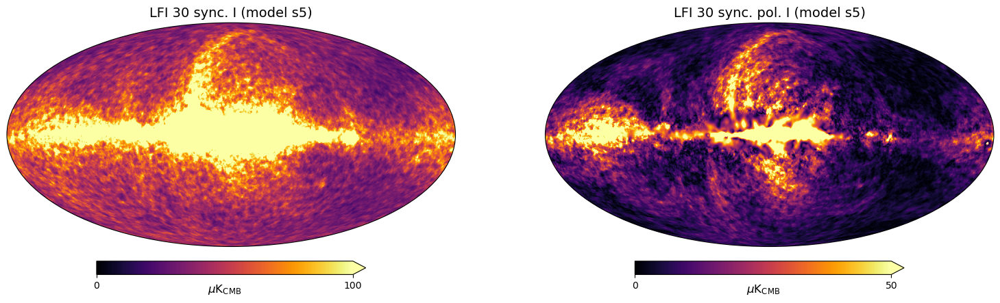

In [53]:
hp.projview(m=iqu_s5_30[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 sync. I (model s5)', graticule_color=None)
hp.projview(m=pol_s5_30, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 sync. pol. I (model s5)', graticule_color=None)

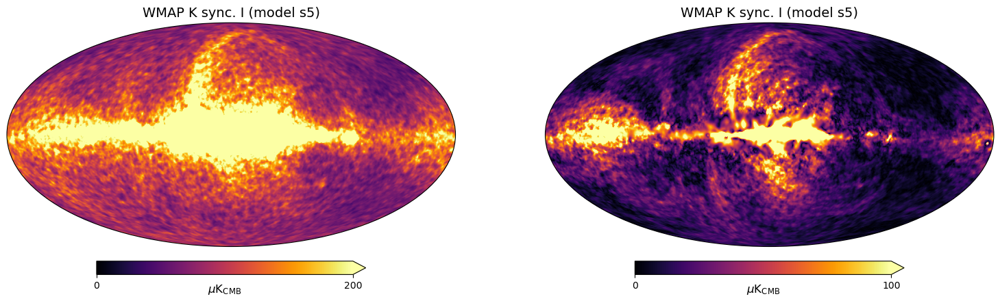

In [54]:
hp.projview(m=iqu_s5_k[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=200, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K sync. I (model s5)', graticule_color=None)
hp.projview(m=pol_s5_k, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K sync. I (model s5)', graticule_color=None)

In [95]:
DlEE_s5_7030, DlBB_s5_7030 = compute_Dl70(iqu_s5_30)
DlEE_s5_70x,  DlBB_s5_70x  = compute_Dl70(iqu_s5_30, iqu_2=iqu_s5_k)

DlEE_s5_6030, DlBB_s5_6030 = compute_Dl60(iqu_s5_30)
DlEE_s5_60x,  DlBB_s5_60x  = compute_Dl60(iqu_s5_30, iqu_2=iqu_s5_k)

DlEE_s5_5030, DlBB_s5_5030 = compute_Dl50(iqu_s5_30)
DlEE_s5_50x,  DlBB_s5_50x  = compute_Dl50(iqu_s5_30, iqu_2=iqu_s5_k)

#### Synchrotron Model 7

In [56]:
iqu_s7_30 = hp.read_map('../data/sync7_v3.4b6_LFI030-bpi_' + str(nside) + '.fits', field=None, dtype=np.float64)
iqu_s7_k  = hp.read_map('../data/sync7_v3.4b6_WMAPK-bpi_' + str(nside_wmap) + '.fits', field=None, dtype=np.float64)

pol_s7_30 = np.sqrt(iqu_s7_30[1]**2. + iqu_s7_30[2]**2.)
pol_s7_k  = np.sqrt(iqu_s7_k[1]**2.  + iqu_s7_k[2]**2.)

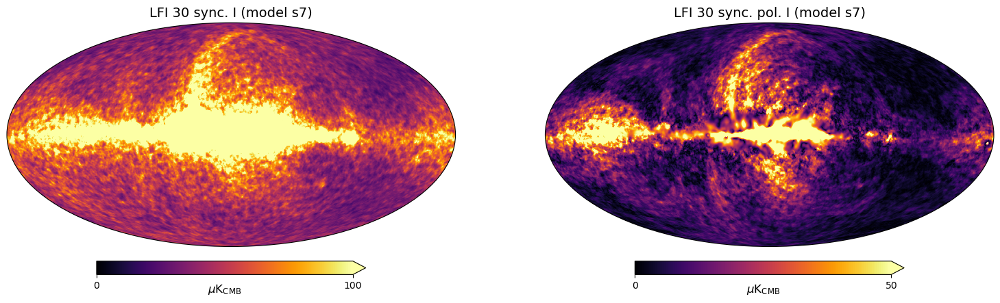

In [57]:
hp.projview(m=iqu_s7_30[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 sync. I (model s7)', graticule_color=None)
hp.projview(m=pol_s7_30, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=50, cmap='inferno', graticule=False, projection_type='mollweide', 
title='LFI 30 sync. pol. I (model s7)', graticule_color=None)

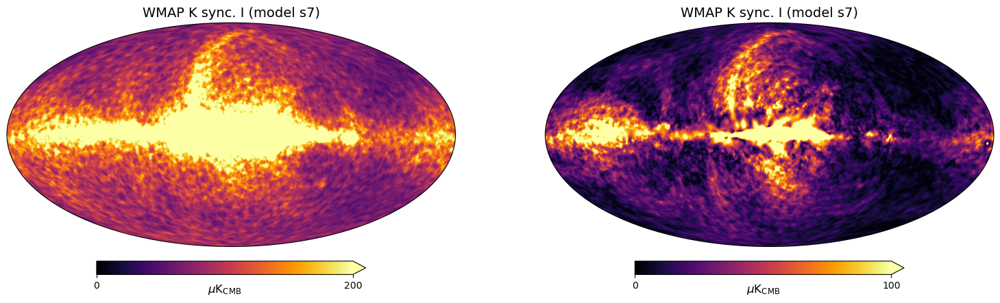

In [58]:
hp.projview(m=iqu_s7_k[0], unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=121, min=0., max=200, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K sync. I (model s7)', graticule_color=None)
hp.projview(m=pol_s7_k, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=122, min=0., max=100, cmap='inferno', graticule=False, projection_type='mollweide', 
title='WMAP K sync. I (model s7)', graticule_color=None)

In [96]:
DlEE_s7_7030, DlBB_s7_7030 = compute_Dl70(iqu_s7_30)
DlEE_s7_70x,  DlBB_s7_70x  = compute_Dl70(iqu_s7_30, iqu_2=iqu_s7_k)

DlEE_s7_6030, DlBB_s7_6030 = compute_Dl60(iqu_s7_30)
DlEE_s7_60x,  DlBB_s7_60x  = compute_Dl60(iqu_s7_30, iqu_2=iqu_s7_k)

DlEE_s7_5030, DlBB_s7_5030 = compute_Dl50(iqu_s7_30)
DlEE_s7_50x,  DlBB_s7_50x  = compute_Dl50(iqu_s7_30, iqu_2=iqu_s7_k)

#### Difference maps

In [61]:
alms = hp.map2alm(iqu_s4_30, lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

print(np.any(np.isnan(Bl_com[:,1]/Bl_30[:,1])))

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_s4_30_smth = hp.alm2map(alms, nside)
pol_s4_30_smth = np.sqrt(iqu_s4_30_smth[1]**2. + iqu_s4_30_smth[2]**2.)

Es4_30_smth = hp.alm2map(alms[1], nside)
Bs4_30_smth = hp.alm2map(alms[2], nside)

False


In [62]:
alms = hp.map2alm(iqu_s5_30, lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

print(np.any(np.isnan(Bl_com[:,1]/Bl_30[:,1])))

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_s5_30_smth = hp.alm2map(alms, nside)
pol_s5_30_smth = np.sqrt(iqu_s5_30_smth[1]**2. + iqu_s5_30_smth[2]**2.)

Es5_30_smth = hp.alm2map(alms[1], nside)
Bs5_30_smth = hp.alm2map(alms[2], nside)

False


In [63]:
alms = hp.map2alm(iqu_s7_30, lmax=lmax, use_weights=True, datapath=hpx_datapath)
Bl_30 = hp.gauss_beam(np.deg2rad(33.1/60.), lmax=lmax, pol=True)
Bl_com = hp.gauss_beam(np.deg2rad(2.), lmax=lmax, pol=True)

print(np.any(np.isnan(Bl_com[:,1]/Bl_30[:,1])))

alms[0] = hp.almxfl(alms[0], Bl_com[:,0]/Bl_30[:,0])
alms[1] = hp.almxfl(alms[1], Bl_com[:,1]/Bl_30[:,1])
alms[2] = hp.almxfl(alms[2], Bl_com[:,2]/Bl_30[:,2])

iqu_s7_30_smth = hp.alm2map(alms, nside)
pol_s7_30_smth = np.sqrt(iqu_s7_30_smth[1]**2. + iqu_s7_30_smth[2]**2.)

Es7_30_smth = hp.alm2map(alms[1], nside)
Bs7_30_smth = hp.alm2map(alms[2], nside)

False


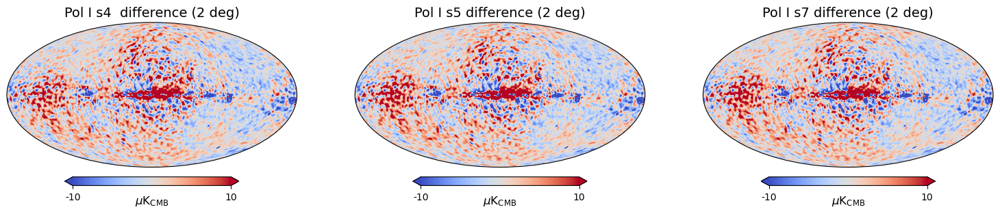

In [64]:
hp.projview(m=pol_s4_30_smth - pol_npipe30_smth - pol_smica_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=131, min=-10., max=10., cmap='coolwarm', graticule=False, projection_type='mollweide', 
title='Pol I s4  difference (2 deg)', graticule_color=None)
hp.projview(m=pol_s5_30_smth - pol_npipe30_smth - pol_smica_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=132, min=-10., max=10., cmap='coolwarm', graticule=False, projection_type='mollweide', 
title='Pol I s5 difference (2 deg)', graticule_color=None)
hp.projview(m=pol_s7_30_smth - pol_npipe30_smth - pol_smica_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=133, min=-10., max=10., cmap='coolwarm', graticule=False, projection_type='mollweide', 
title='Pol I s7 difference (2 deg)', graticule_color=None)

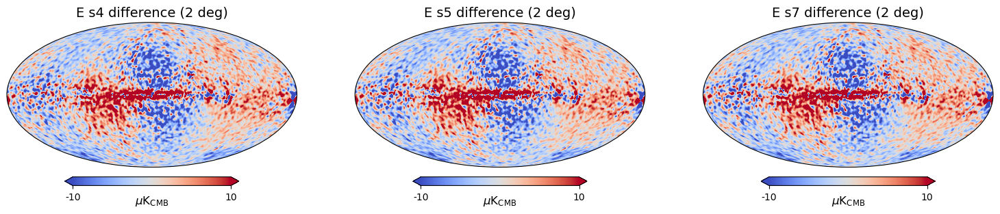

In [65]:
hp.projview(m=Es4_30_smth - E_npipe30_smth - E_smica_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=131, min=-10., max=10., cmap='coolwarm', graticule=False, projection_type='mollweide', 
title='E s4 difference (2 deg)', graticule_color=None)
hp.projview(m=Es5_30_smth - E_npipe30_smth - E_smica_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=132, min=-10., max=10., cmap='coolwarm', graticule=False, projection_type='mollweide', 
title='E s5 difference (2 deg)', graticule_color=None)
hp.projview(m=Es7_30_smth - E_npipe30_smth - E_smica_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=133, min=-10., max=10., cmap='coolwarm', graticule=False, projection_type='mollweide', 
title='E s7 difference (2 deg)', graticule_color=None)

#### Plots

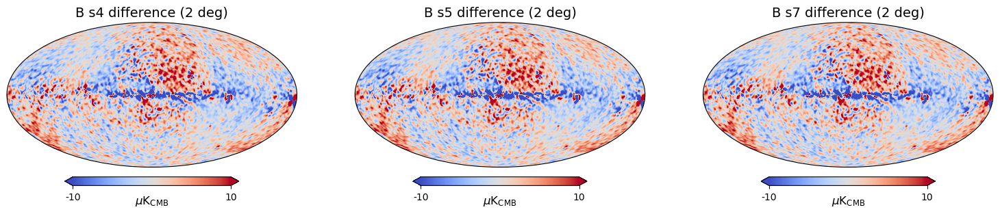

In [66]:
hp.projview(m=Bs4_30_smth - B_npipe30_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=131, min=-10., max=10., cmap='coolwarm', graticule=False, projection_type='mollweide', 
title='B s4 difference (2 deg)', graticule_color=None)
hp.projview(m=Bs5_30_smth - B_npipe30_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=132, min=-10., max=10., cmap='coolwarm', graticule=False, projection_type='mollweide', 
title='B s5 difference (2 deg)', graticule_color=None)
hp.projview(m=Bs7_30_smth - B_npipe30_smth, unit=r'$\mu$K${}_{\rm CMB}$', xsize=2000, width=15., sub=133, min=-10., max=10., cmap='coolwarm', graticule=False, projection_type='mollweide', 
title='B s7 difference (2 deg)', graticule_color=None)

#### Scatter plots

Text(0.5, 1.0, 'E map scatter')

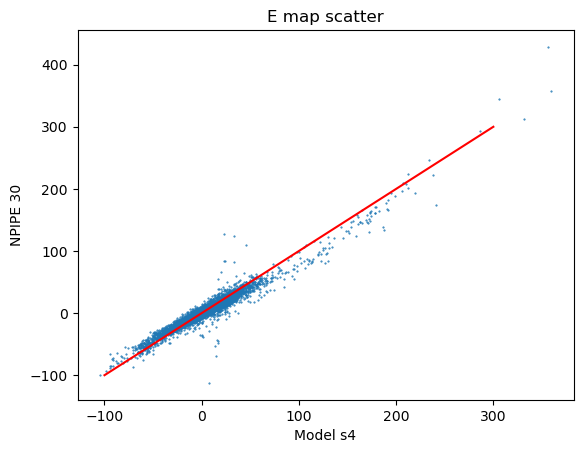

In [67]:
a = np.linspace(-100., 300, num=300)
Es4_32 = hp.ud_grade(Es4_30_smth, 32)
Enpipe_32 = hp.ud_grade(E_npipe30_smth, 32)
Esmica_32 = hp.ud_grade(E_smica_smth, 32)
plt.plot(Es4_32, Enpipe_32 - Esmica_32, 'o', ms=0.5)
plt.plot(a,a, 'r-')
plt.xlabel('Model s4')
plt.ylabel('NPIPE 30')
plt.title('E map scatter')


Text(0.5, 1.0, 'B map scatter')

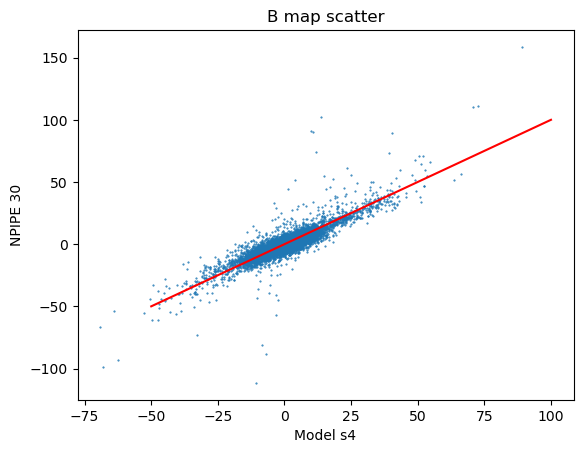

In [68]:
a = np.linspace(-50., 100, num=300)
Bs4_32 = hp.ud_grade(Bs4_30_smth, 32)
Bnpipe_32 = hp.ud_grade(B_npipe30_smth, 32)
plt.plot(Bs4_32, Bnpipe_32, 'o', ms=0.5)
plt.plot(a,a, 'r-')
plt.xlabel('Model s4')
plt.ylabel('NPIPE 30')
plt.title('B map scatter')

Text(0.5, 1.0, 'E map scatter')

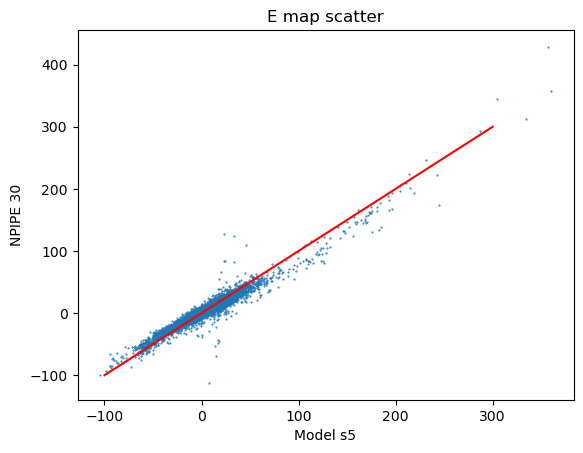

In [69]:
a = np.linspace(-100., 300, num=300)
Es5_32 = hp.ud_grade(Es5_30_smth, 32)
Enpipe_32 = hp.ud_grade(E_npipe30_smth, 32)
Esmica_32 = hp.ud_grade(E_smica_smth, 32)
plt.plot(Es5_32, Enpipe_32 - Esmica_32, 'o', ms=0.5)
plt.plot(a,a, 'r-')
plt.xlabel('Model s5')
plt.ylabel('NPIPE 30')
plt.title('E map scatter')

Text(0.5, 1.0, 'B map scatter')

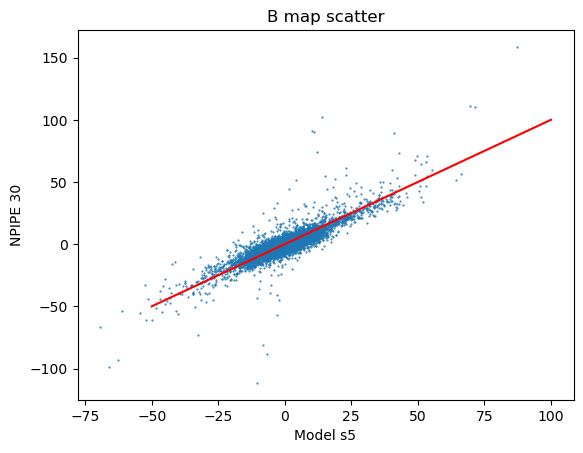

In [70]:
a = np.linspace(-50., 100, num=300)
Bs5_32 = hp.ud_grade(Bs5_30_smth, 32)
Bnpipe_32 = hp.ud_grade(B_npipe30_smth, 32)
plt.plot(Bs5_32, Bnpipe_32, 'o', ms=0.5)
plt.plot(a,a, 'r-')
plt.xlabel('Model s5')
plt.ylabel('NPIPE 30')
plt.title('B map scatter')

Text(0.5, 1.0, 'E map scatter')

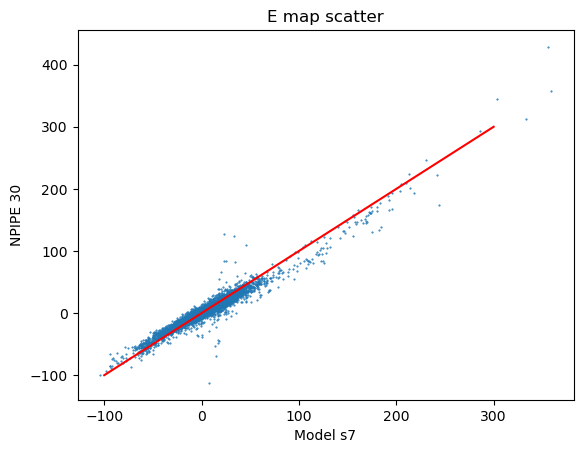

In [71]:
a = np.linspace(-100., 300, num=300)
Es7_32 = hp.ud_grade(Es7_30_smth, 32)
Enpipe_32 = hp.ud_grade(E_npipe30_smth, 32)
Esmica_32 = hp.ud_grade(E_smica_smth, 32)
plt.plot(Es7_32, Enpipe_32 - Esmica_32, 'o', ms=0.5)
plt.plot(a,a, 'r-')
plt.xlabel('Model s7')
plt.ylabel('NPIPE 30')
plt.title('E map scatter')

Text(0.5, 1.0, 'B map scatter')

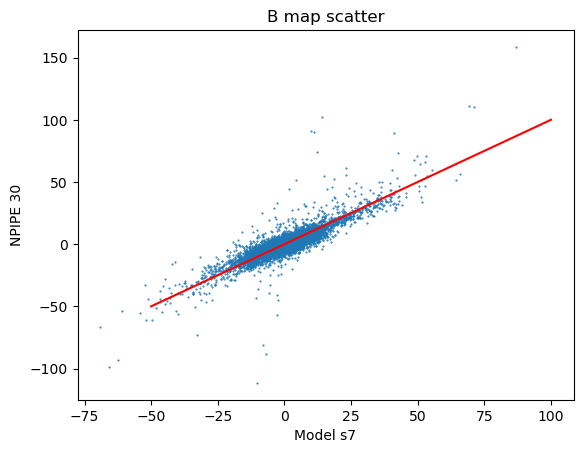

In [72]:
a = np.linspace(-50., 100, num=300)
Bs7_32 = hp.ud_grade(Bs7_30_smth, 32)
Bnpipe_32 = hp.ud_grade(B_npipe30_smth, 32)
plt.plot(Bs7_32, Bnpipe_32, 'o', ms=0.5)
plt.plot(a,a, 'r-')
plt.xlabel('Model s7')
plt.ylabel('NPIPE 30')
plt.title('B map scatter')

#### Power spectra plots

In [73]:
print(np.any(binner(DlEE_npxk_70[2:501])<0.), np.any(DlEE_npxk_70[2:501] < 0.), np.any(DlEE_AxB_70[2:501] < 0.), np.any(binner(DlEE_AxB_70[2:501]) < 0.))
print(np.any(binner(DlBB_npxk_70[2:501])<0.), np.any(DlBB_npxk_70[2:501] < 0.), np.any(DlBB_AxB_70[2:501] < 0.), np.any(binner(DlBB_AxB_70[2:501]) < 0.))

True True True True
True True True True


In [75]:
ellmax = 1024
ells = np.arange(0, ellmax+1)
Dell_factor = ells * (ells + 1.) / 2. / np.pi

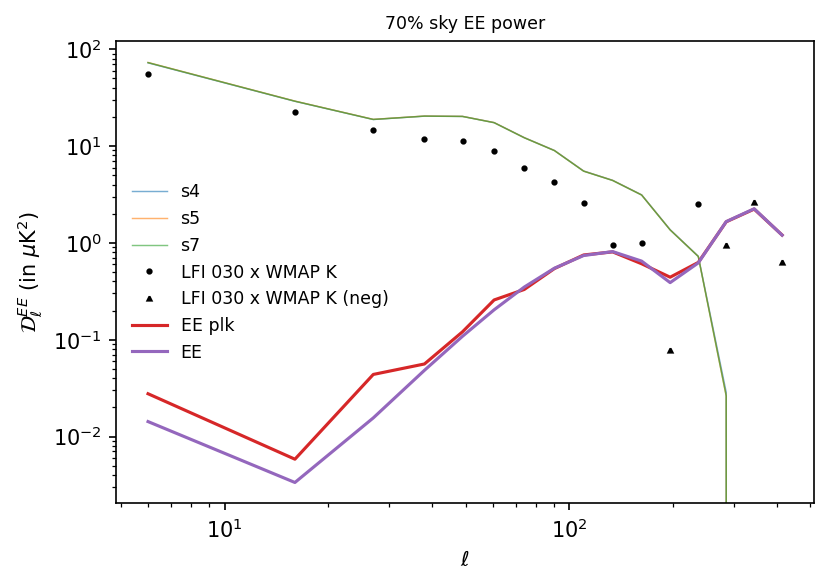

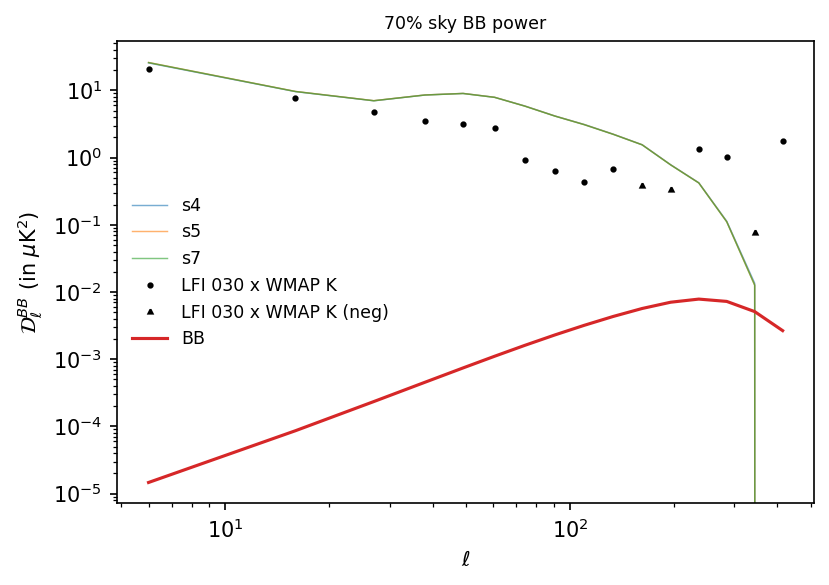

In [103]:
fig_new, ax = plt.subplots(num=1, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(DlEE_s4_70x [:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(DlEE_s5_70x [:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(DlEE_s7_70x [:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner(DlEE_npxk_70[:501]),  'ko', ms=2.,label='LFI 030 x WMAP K')
ax.plot(leff, -binner(DlEE_npxk_70[:501]), 'k^', ms=2., label='LFI 030 x WMAP K (neg)')
ax.plot(leff, binner((plkEE)[:501]*Bl[:501,1]**2./calPLK**2.), '-', ms=2.,label='EE plk')
ax.plot(leff, binner(Dell_factor[:501]*EE[:501]), '-', ms=2.,label='EE')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{EE}$ (in $\mu{\rm K}^2$)')
ax.set_title('70% sky EE power', fontsize='small')
plt.savefig('../output/DlEE_PySM3-4b6_vs_LFI30xWMAPK_BPI_70pc.jpg', bbox_inches='tight', pad_inches=0.1)

fig_new, ax = plt.subplots(num=2, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(DlBB_s4_70x [0:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(DlBB_s5_70x [0:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(DlBB_s7_70x [0:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner(DlBB_npxk_70[0:501]), 'ko', ms=2.,label='LFI 030 x WMAP K')
ax.plot(leff, -binner(DlBB_npxk_70[:501]), 'k^', ms=2., label='LFI 030 x WMAP K (neg)')
ax.plot(leff, binner(Dell_factor[0:501]*BB[0:501]), '-', ms=2.,label='BB')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{BB}$ (in $\mu{\rm K}^2$)')
ax.set_title('70% sky BB power', fontsize='small')
plt.savefig('../output/DlBB_PySM3-4b6_vs_LFI30xWMAPK_BPI_70pc.jpg', bbox_inches='tight', pad_inches=0.1)

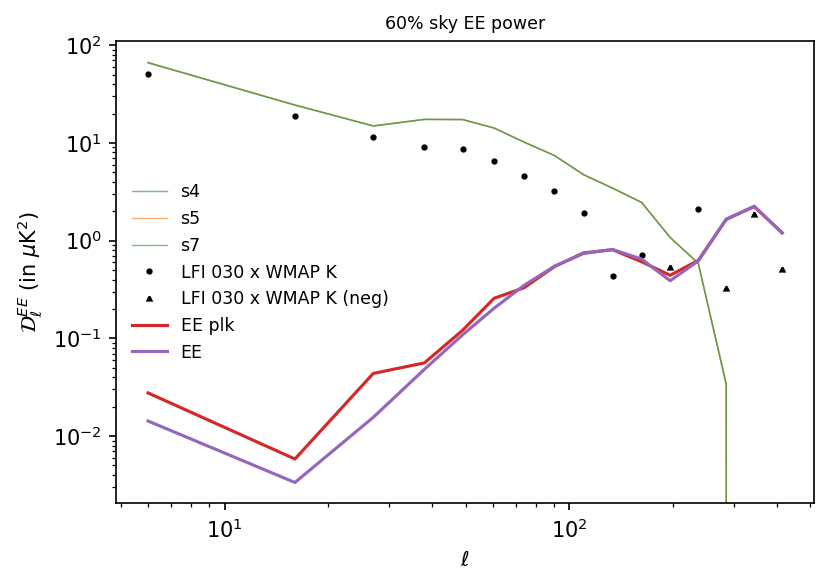

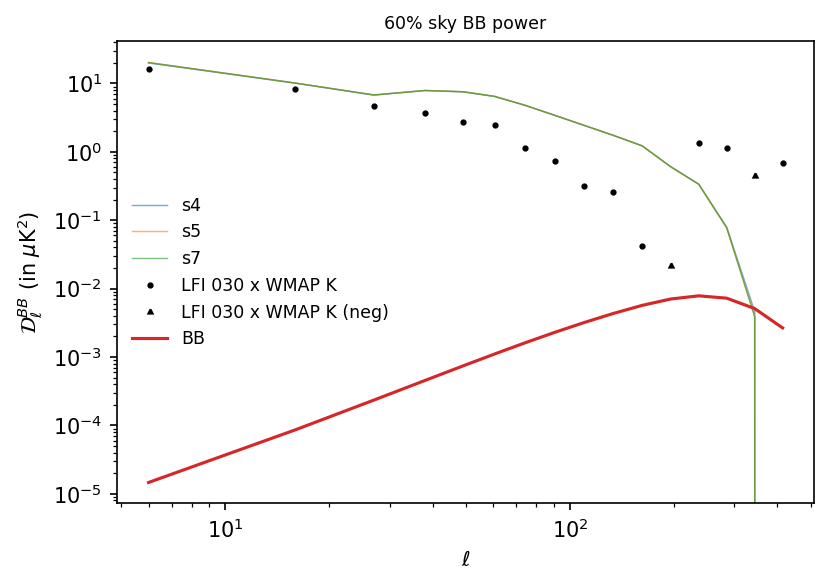

In [104]:
fig_new, ax = plt.subplots(num=1, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(  DlEE_s4_60x [:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(  DlEE_s5_60x [:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(  DlEE_s7_60x [:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner(  DlEE_npxk_60[:501]), 'ko', ms=2.,label='LFI 030 x WMAP K')
ax.plot(leff, -binner(DlEE_npxk_60[:501]),  'k^', ms=2., label='LFI 030 x WMAP K (neg)')
ax.plot(leff, binner((plkEE)[:501]*Bl[:501,1]**2./calPLK**2.), '-', ms=2.,label='EE plk')
ax.plot(leff, binner(Dell_factor[:501]*EE[:501]), '-', ms=2.,label='EE')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{EE}$ (in $\mu{\rm K}^2$)')
ax.set_title('60% sky EE power', fontsize='small')
plt.savefig('../output/DlEE_PySM3-4b6_vs_LFI30xWMAPK_BPI_60pc.jpg', bbox_inches='tight', pad_inches=0.1)

fig_new, ax = plt.subplots(num=2, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(  DlBB_s4_60x [:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(  DlBB_s5_60x [:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(  DlBB_s7_60x [:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner(  DlBB_npxk_60[:501]), 'ko', ms=2.,label='LFI 030 x WMAP K')
ax.plot(leff, -binner(DlBB_npxk_60[:501]),  'k^', ms=2., label='LFI 030 x WMAP K (neg)')
ax.plot(leff, binner(Dell_factor[:501]*BB[:501]), '-', ms=2.,label='BB')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{BB}$ (in $\mu{\rm K}^2$)')
ax.set_title('60% sky BB power', fontsize='small')
plt.savefig('../output/DlBB_PySM3-4b6_vs_LFI30xWMAPK_BPI_60pc.jpg', bbox_inches='tight', pad_inches=0.1)

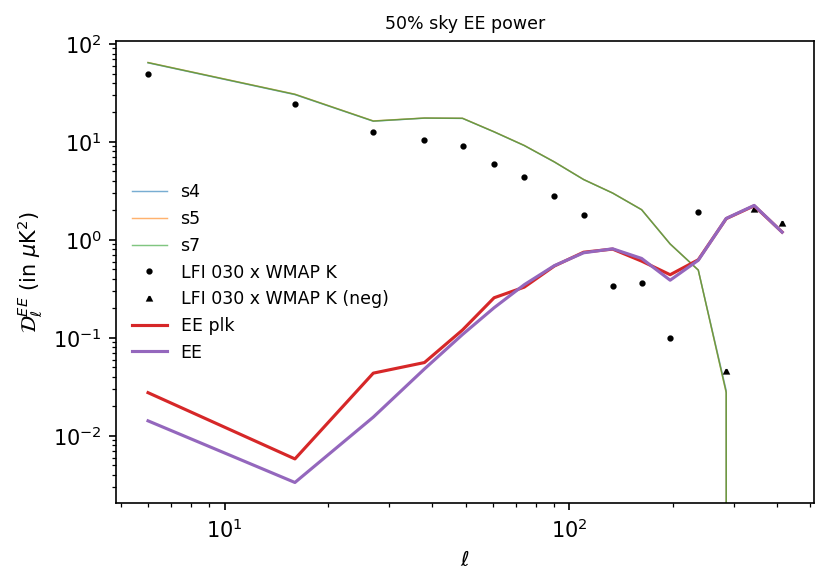

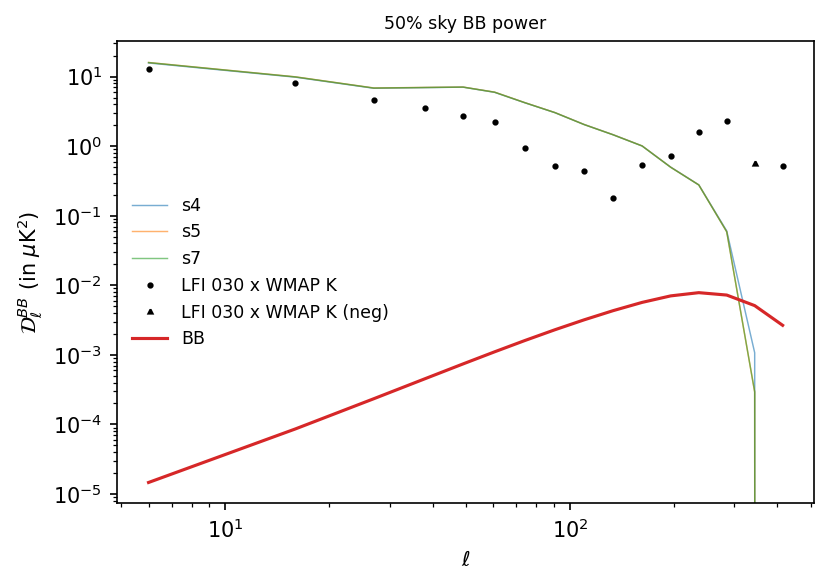

In [105]:
fig_new, ax = plt.subplots(num=1, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(  DlEE_s4_50x [:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(  DlEE_s5_50x [:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(  DlEE_s7_50x [:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner(  DlEE_npxk_50[:501]), 'ko', ms=2.,label='LFI 030 x WMAP K')
ax.plot(leff, -binner(DlEE_npxk_50[:501]),  'k^', ms=2., label='LFI 030 x WMAP K (neg)')
ax.plot(leff, binner((plkEE)[:501]*Bl[:501,1]**2./calPLK**2.), '-', ms=2.,label='EE plk')
ax.plot(leff, binner(Dell_factor[:501]*EE[:501]), '-', ms=2.,label='EE')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{EE}$ (in $\mu{\rm K}^2$)')
ax.set_title('50% sky EE power', fontsize='small')
plt.savefig('../output/DlEE_PySM3-4b6_vs_LFI30xWMAPK_BPI_50pc.jpg', bbox_inches='tight', pad_inches=0.1)

fig_new, ax = plt.subplots(num=2, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(  DlBB_s4_50x [:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(  DlBB_s5_50x [:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(  DlBB_s7_50x [:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner(  DlBB_npxk_50[:501]), 'ko', ms=2.,label='LFI 030 x WMAP K')
ax.plot(leff, -binner(DlBB_npxk_50[:501]),  'k^', ms=2., label='LFI 030 x WMAP K (neg)')
ax.plot(leff, binner(Dell_factor[:501]*BB[:501]), '-', ms=2.,label='BB')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{BB}$ (in $\mu{\rm K}^2$)')
ax.set_title('50% sky BB power', fontsize='small')
plt.savefig('../output/DlBB_PySM3-4b6_vs_LFI30xWMAPK_BPI_50pc.jpg', bbox_inches='tight', pad_inches=0.1)

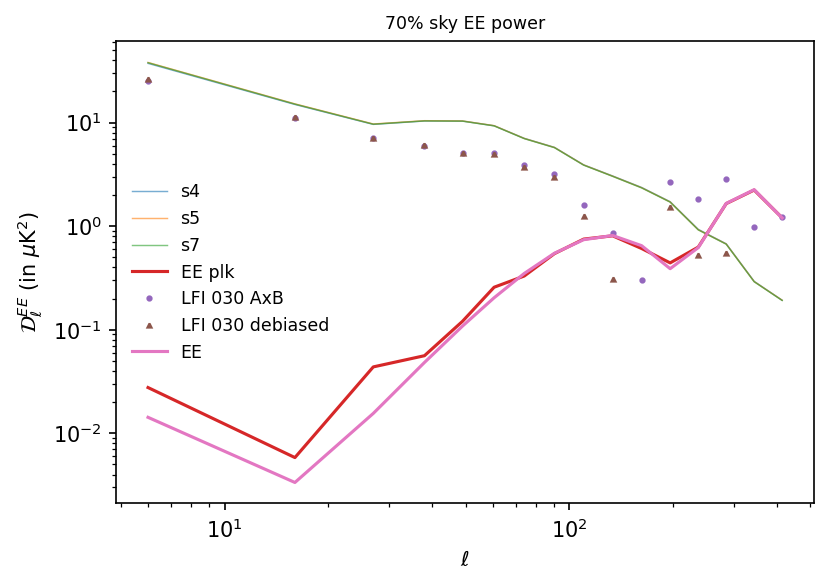

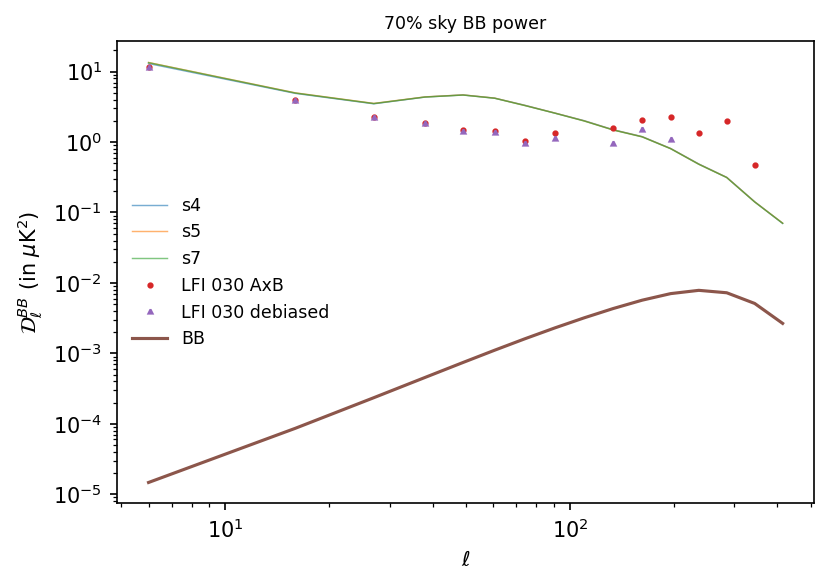

In [100]:
fig_new, ax = plt.subplots(num=1, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(DlEE_s4_7030 [:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(DlEE_s5_7030 [:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(DlEE_s7_7030 [:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner((plkEE)[:501]*Bl[:501,1]**2./calPLK**2.), '-', ms=2.,label='EE plk')
ax.plot(leff, binner(  DlEE_AxB_70[:501]), 'o', ms=2.,label='LFI 030 AxB')
ax.plot(leff, binner(DlEE_npipe_70[:501] - DlEE_hd_70[:501]), '^', ms=2.,label='LFI 030 debiased')
ax.plot(leff, binner(  Dell_factor[:501]*EE[:501]), '-', ms=2.,label='EE')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{EE}$ (in $\mu{\rm K}^2$)')
ax.set_title('70% sky EE power', fontsize='small')
plt.savefig('../output/DlEE_PySM3-4b6_vs_LFI30_BPI_70pc.jpg', bbox_inches='tight', pad_inches=0.1)

fig_new, ax = plt.subplots(num=2, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(DlBB_s4_7030 [:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(DlBB_s5_7030 [:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(DlBB_s7_7030 [:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner(  DlBB_AxB_70[:501]), 'o', ms=2.,label='LFI 030 AxB')
ax.plot(leff, binner(DlBB_npipe_70[:501] - DlBB_hd_70[:501]), '^', ms=2.,label='LFI 030 debiased')
ax.plot(leff, binner(  Dell_factor[:501]*BB[:501]), '-', ms=2.,label='BB')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{BB}$ (in $\mu{\rm K}^2$)')
ax.set_title('70% sky BB power', fontsize='small')
plt.savefig('../output/DlBB_PySM3-4b6_vs_LFI30_BPI_70pc.jpg', bbox_inches='tight', pad_inches=0.1)

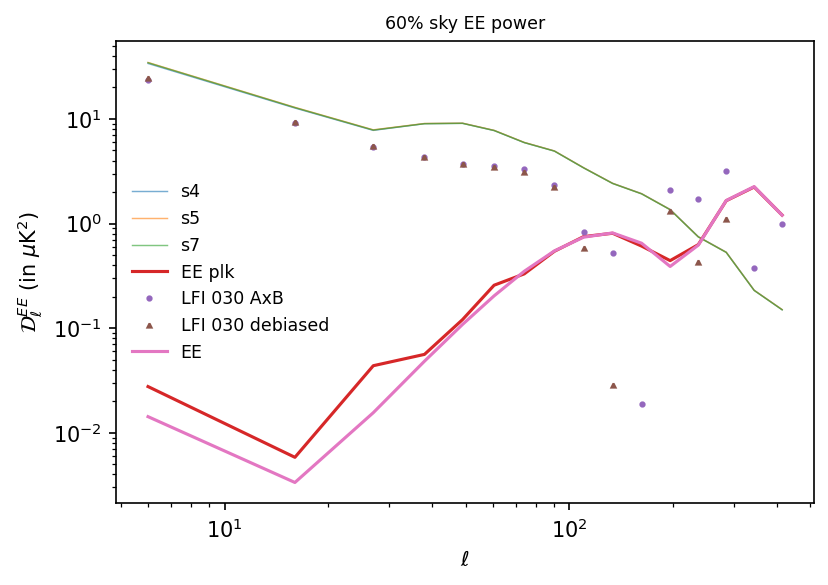

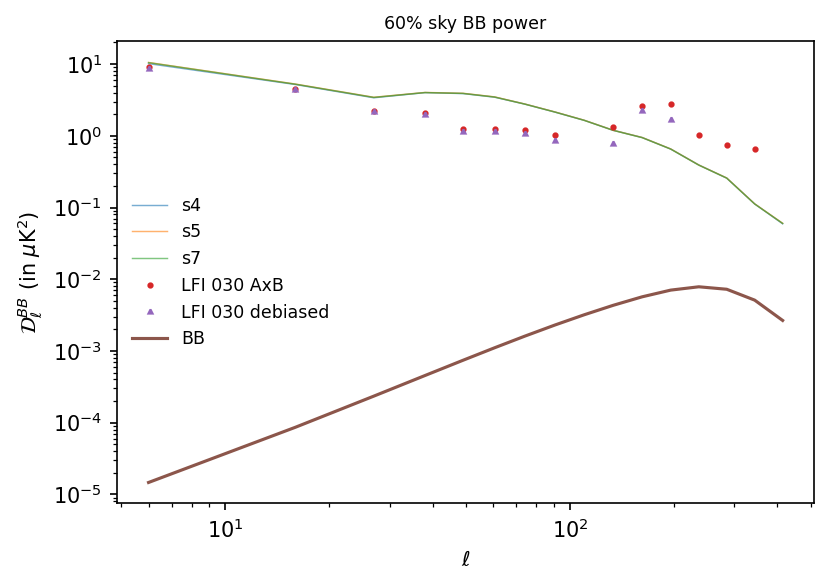

In [101]:
fig_new, ax = plt.subplots(num=1, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(DlEE_s4_6030 [:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(DlEE_s5_6030 [:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(DlEE_s7_6030 [:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner((plkEE)[:501]*Bl[:501,1]**2./calPLK**2.), '-', ms=2.,label='EE plk')
ax.plot(leff, binner(  DlEE_AxB_60[:501]), 'o', ms=2.,label='LFI 030 AxB')
ax.plot(leff, binner(DlEE_npipe_60[:501] - DlEE_hd_60[:501]), '^', ms=2.,label='LFI 030 debiased')
ax.plot(leff, binner(  Dell_factor[:501]*EE[:501]), '-', ms=2.,label='EE')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{EE}$ (in $\mu{\rm K}^2$)')
ax.set_title('60% sky EE power', fontsize='small')
plt.savefig('../output/DlEE_PySM3-4b6_vs_LFI30_BPI_60pc.jpg', bbox_inches='tight', pad_inches=0.1)

fig_new, ax = plt.subplots(num=2, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(DlBB_s4_6030 [:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(DlBB_s5_6030 [:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(DlBB_s7_6030 [:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner(  DlBB_AxB_60[:501]), 'o', ms=2.,label='LFI 030 AxB')
ax.plot(leff, binner(DlBB_npipe_60[:501] - DlBB_hd_60[:501]), '^', ms=2.,label='LFI 030 debiased')
ax.plot(leff, binner(  Dell_factor[:501]*BB[:501]), '-', ms=2.,label='BB')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{BB}$ (in $\mu{\rm K}^2$)')
ax.set_title('60% sky BB power', fontsize='small')
plt.savefig('../output/DlBB_PySM3-4b6_vs_LFI30_BPI_60pc.jpg', bbox_inches='tight', pad_inches=0.1)

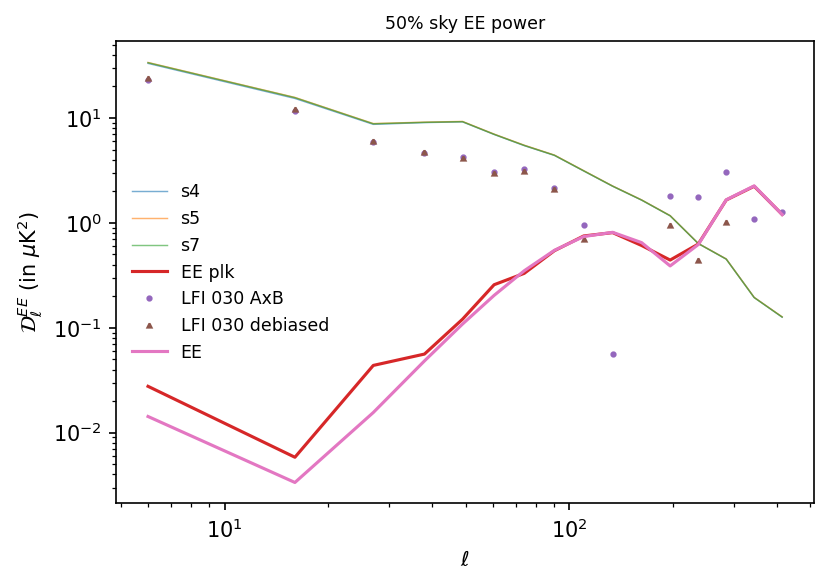

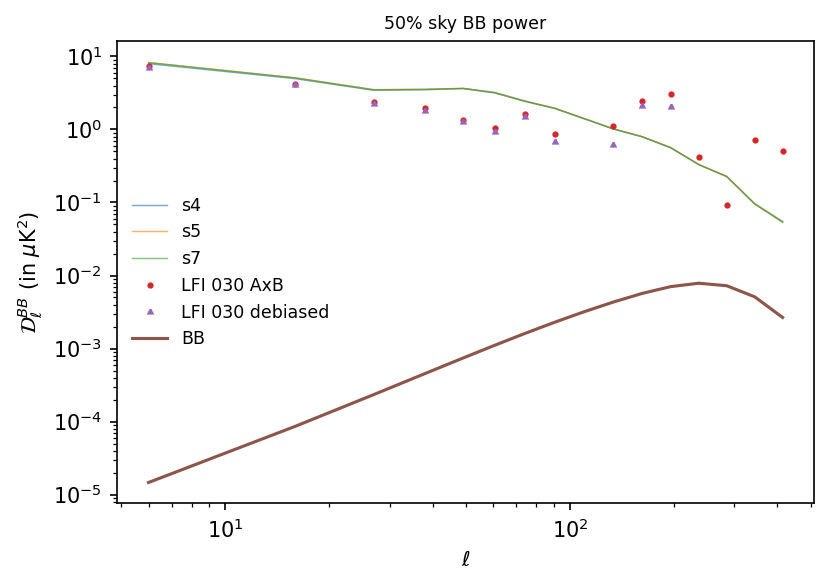

In [102]:
fig_new, ax = plt.subplots(num=1, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(DlEE_s4_5030 [:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(DlEE_s5_5030 [:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(DlEE_s7_5030 [:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner((plkEE)[:501]*Bl[:501,1]**2./calPLK**2.), '-', ms=2.,label='EE plk')
ax.plot(leff, binner(  DlEE_AxB_50[:501]), 'o', ms=2.,label='LFI 030 AxB')
ax.plot(leff, binner(DlEE_npipe_50[:501] - DlEE_hd_50[:501]), '^', ms=2.,label='LFI 030 debiased')
ax.plot(leff, binner(  Dell_factor[:501]*EE[:501]), '-', ms=2.,label='EE')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{EE}$ (in $\mu{\rm K}^2$)')
ax.set_title('50% sky EE power', fontsize='small')
plt.savefig('../output/DlEE_PySM3-4b6_vs_LFI30_BPI_50pc.jpg', bbox_inches='tight', pad_inches=0.1)

fig_new, ax = plt.subplots(num=2, figsize=(6, 4), dpi=150)
ax.plot(leff, binner(DlBB_s4_5030 [:501]), '-', lw=0.7, alpha=0.6,label='s4')
ax.plot(leff, binner(DlBB_s5_5030 [:501]), '-', lw=0.7, alpha=0.6,label='s5')
ax.plot(leff, binner(DlBB_s7_5030 [:501]), '-', lw=0.7, alpha=0.6,label='s7')
ax.plot(leff, binner(  DlBB_AxB_50[:501]), 'o', ms=2.,label='LFI 030 AxB')
ax.plot(leff, binner(DlBB_npipe_50[:501] - DlBB_hd_50[:501]), '^', ms=2.,label='LFI 030 debiased')
ax.plot(leff, binner(  Dell_factor[:501]*BB[:501]), '-', ms=2.,label='BB')
ax.loglog()
ax.legend(fontsize='small', frameon=False)
ax.set_xlabel(r'$\ell$')
ax.set_ylabel(r'$\mathcal{D}_\ell^{BB}$ (in $\mu{\rm K}^2$)')
ax.set_title('50% sky BB power', fontsize='small')
plt.savefig('../output/DlBB_PySM3-4b6_vs_LFI30_BPI_50pc.jpg', bbox_inches='tight', pad_inches=0.1)